## Packages etc.

In [2]:
# Import TensorFlow and check the version
import tensorflow as tf
print(tf.__version__)

2.17.0


In [3]:
# Import TensorFlow datasets
import tensorflow_datasets as tfds
print(tfds.__version__)

4.9.6


In [4]:
from tensorflow.keras import mixed_precision
from tensorflow.keras import mixed_precision
from tensorflow.keras import layers

import pandas as pd
import numpy as np

from collections import Counter
from itertools import product

import matplotlib.pyplot as plt
import os.path

## Downloading and studying the data

In [5]:
(train_data, test_data), data_info = tfds.load(name="food101", # target dataset to download  
                                            data_dir="input_data/",                                  
                                            split=["train[:80%]", "validation[80%:]"],
                                            shuffle_files=True, # shuffle files on download
                                            as_supervised=True, # download data in tuple format, (image, label)
                                            with_info=True)


In [6]:
print(train_data)
print(test_data)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>
<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [7]:
print('Images in the train set: {}'.format(train_data.cardinality().numpy()))
print('Images in the test set: {}'.format(test_data.cardinality().numpy()))

Images in the train set: 60600
Images in the test set: 5050


In [8]:
class_names = data_info.features["label"].names # list of classes
print('Number of classes in the full dataset: {}'.format(len(class_names)))
print('Some random examples: ', ', '.join(np.random.choice(class_names, 10)))

Number of classes in the full dataset: 101
Some random examples:  caesar_salad, dumplings, grilled_salmon, edamame, tuna_tartare, baklava, peking_duck, tacos, ravioli, sashimi


In [9]:
# Distribution of classes between the two datasets
pd.set_option("display.max_rows", None)

display(pd.concat([pd.DataFrame.from_dict(Counter([class_names[label.numpy()] for _, label in train_data]),
                       orient="index", columns=['Train set']),
                   pd.DataFrame.from_dict(Counter([class_names[label.numpy()] for _, label in test_data]),
                       orient="index", columns=['Test set'])
                   ], axis=1).fillna(0).astype(int).sort_index().reset_index().rename(columns={'index':'Class'}))

,Class,Train set,Test set
0,apple_pie,600,58
1,baby_back_ribs,585,40
2,baklava,622,52
3,beef_carpaccio,608,51
4,beef_tartare,605,46
5,beet_salad,621,54
6,beignets,598,52
7,bibimbap,601,48
8,bread_pudding,608,51
9,breakfast_burrito,602,49


In [10]:
# Distribution of shapes between the two datasets
pd.set_option("display.max_rows", None)

display(pd.concat([pd.DataFrame.from_dict(dict(Counter(['-'.join([str(n) for n in np.array(image.shape)]) for image, _ in train_data])),
                       orient="index", columns=['Train set']),
                   pd.DataFrame.from_dict(dict(Counter(['-'.join([str(n) for n in np.array(image.shape)]) for image, _ in test_data])),
                       orient="index", columns=['Test set'])
                   ], axis=1).fillna(0).astype(int).sort_values('Train set', ascending=False).reset_index().rename(columns={'index':'Shape'}))

,Shape,Train set,Test set
0,512-512-3,37396,3057
1,384-512-3,8740,799
2,512-384-3,3901,331
3,512-382-3,1738,136
4,382-512-3,1487,138
5,341-512-3,880,79
6,306-512-3,637,52
7,288-512-3,546,43
8,289-512-3,520,55
9,512-511-3,339,22


Image shape: (512, 384, 3)
Image data type: <class 'numpy.uint8'>


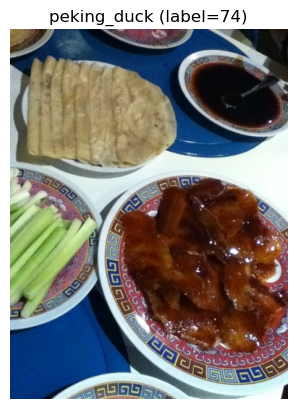

Image shape: (512, 512, 3)
Image data type: <class 'numpy.uint8'>


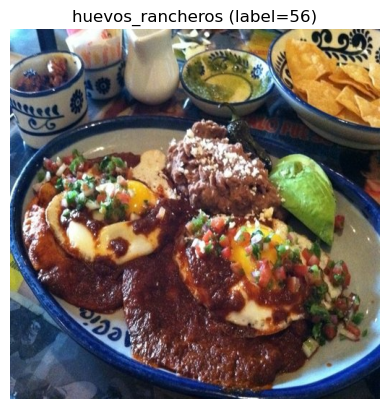

In [11]:
# A few training samples
for image, label in train_data.take(2):
    print('Image shape: {}'.format(image.shape))
    print('Image data type: {}'.format(image.dtype.as_numpy_dtype))
    plt.imshow(image)
    plt.title('{} (label={})'.format(class_names[label], label))
    plt.axis(False)
    plt.show()
del(image, label)

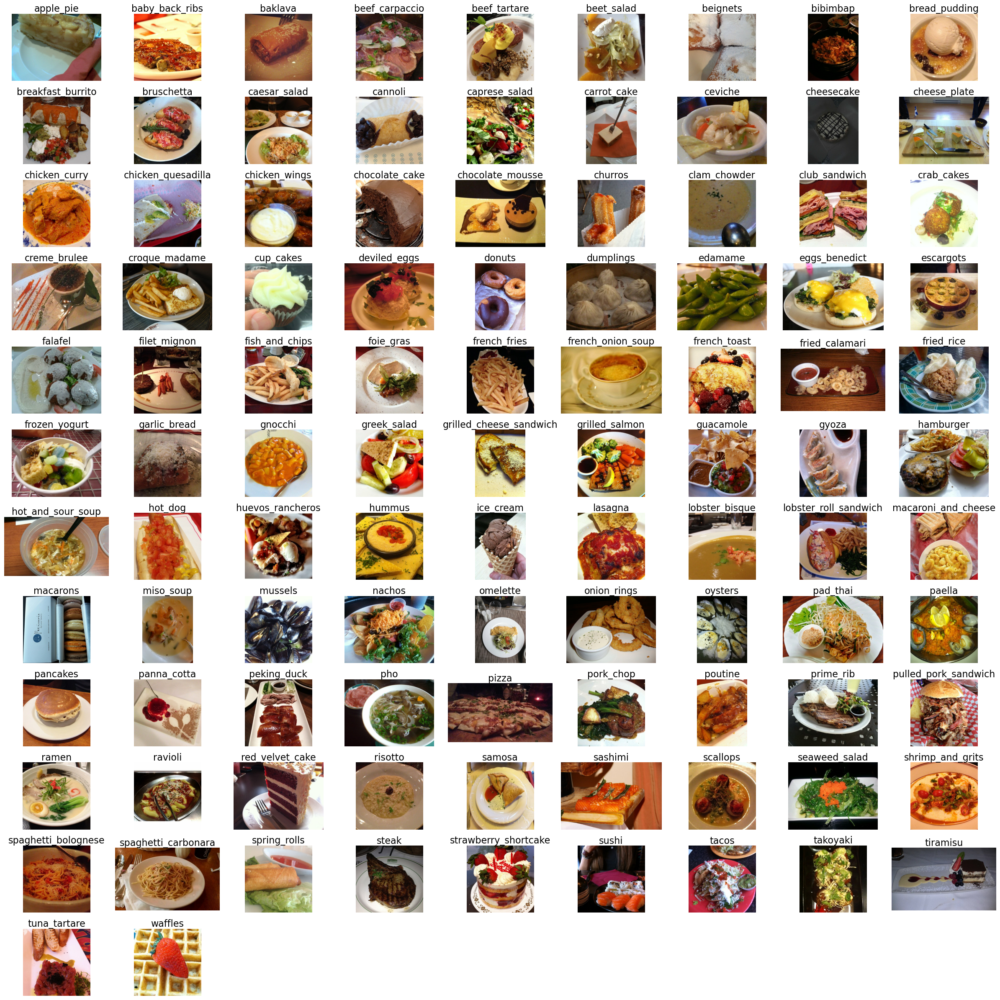

In [12]:
# One image per label in the test set
cols = 9
rows = len(class_names)//cols + 1
fig, ax = plt.subplots(rows, cols, figsize=(24,24))
for label, (i, j) in enumerate(product(range(rows), range(cols))):
    if label < len(class_names):
        image = next(img for img, lab in test_data if lab.numpy()==label)
        class_name = class_names[label]
        ax[i][j].imshow(image)
        ax[i][j].set_title(class_name, pad = 4, fontsize=16)

for ax in ax.ravel():
    ax.set_axis_off()
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout()

del(rows, cols, label, image, class_name, fig, ax, i, j)

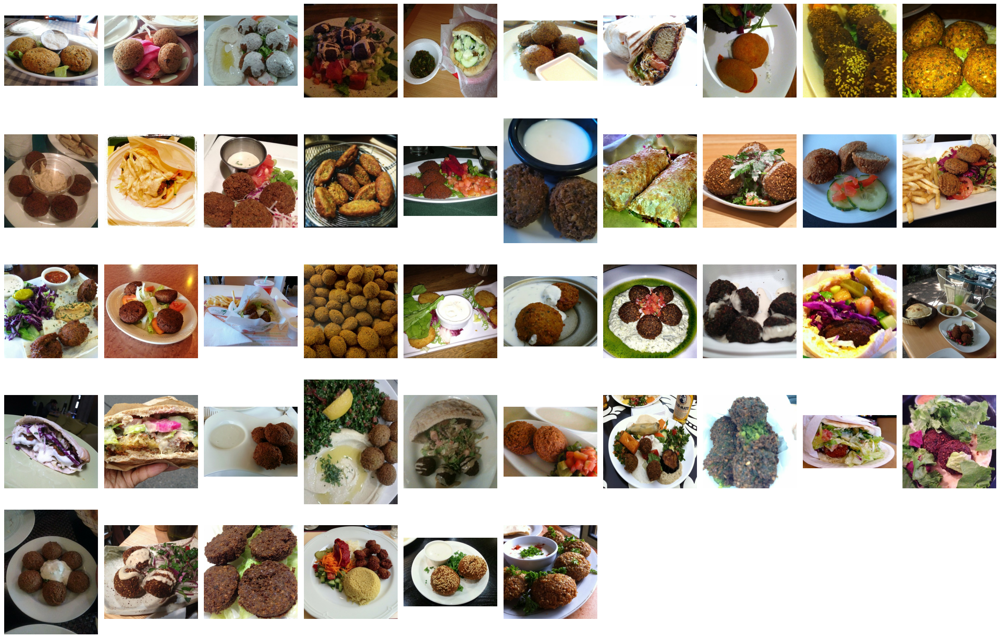

In [13]:
# Falafels only
images = [image for image, label in test_data if class_names[label.numpy()]=='falafel']
cols = 10
rows = len(images)//cols + 1
fig, ax = plt.subplots(rows, cols, figsize=(24,16))
for n, (i, j) in enumerate(product(range(rows), range(cols))):
    if n < len(images):
        ax[i][j].imshow(images[n])

for ax in ax.ravel():
    ax.set_axis_off()
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout()

del(rows, cols, images, fig, ax, n, i, j)

## Preprocessing the data

In [14]:
def preprocessing_image(image, image_shape=224):
    image = tf.image.resize(image, [image_shape, image_shape])  # reshape to image_shape
    return tf.cast(image, tf.float32)

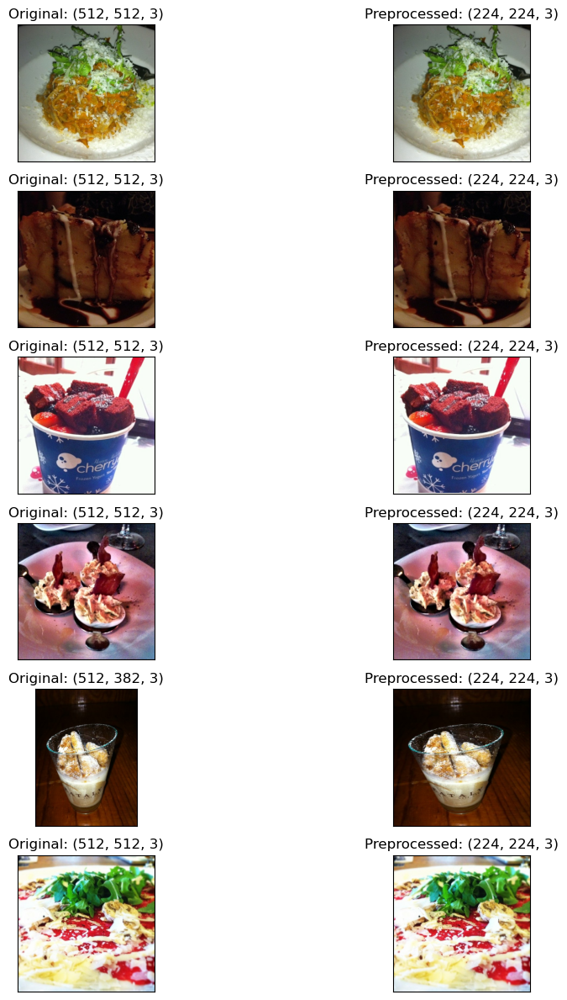

In [15]:
num_examples = 6
fig, ax = plt.subplots(num_examples, 2, figsize=(12, num_examples * 2))
for i, (image, label) in enumerate(train_data.take(num_examples)):
    prep_img = preprocessing_image(image)
    ax[i][0].imshow(image/255)
    ax[i][1].imshow(prep_img/255)
    ax[i][0].set_title('Original: {}'.format(image.shape, fontsize=8))
    ax[i][1].set_title('Preprocessed: {}'.format(prep_img.shape, fontsize=10))
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout()
del(num_examples, fig, ax, i, image, label, prep_img)

In [16]:
batch_size=32

In [17]:
# Map to preprocess the train and test data and paralellize it
train_data_preprocessed = train_data.map(map_func=(lambda image, label: (preprocessing_image(image), label)), num_parallel_calls=tf.data.AUTOTUNE)
test_data_preprocessed = test_data.map(map_func=(lambda image, label: (preprocessing_image(image), label)), num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle train and test data and turn it into batches and prefetch it (load it faster)
train_data_preprocessed = train_data_preprocessed.shuffle(buffer_size=1000, seed=42).batch(batch_size=batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)
test_data_preprocessed = test_data_preprocessed.shuffle(buffer_size=1000, seed=42).batch(batch_size=batch_size).prefetch(buffer_size=tf.data.AUTOTUNE)

## Augmenting data

In [18]:
def augment(image, threshold):
    # Augment the image only if the random parameter is larger than the 'threshold' parameter
    if np.random.uniform() > threshold:
        data_augmentation_layers = tf.keras.Sequential([])
        # Random flip
        data_augmentation_layers.add(tf.keras.layers.RandomFlip(mode="horizontal", seed=42))
        # # Random rotation between -0.1*2*Pi and 0.1*2*Pi
        data_augmentation_layers.add(tf.keras.layers.RandomRotation(factor=(-0.1, 0.1),  fill_mode='constant', seed=42))
        # # Random zoom in both directions
        data_augmentation_layers.add(tf.keras.layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), fill_mode='constant', seed=42))
        # Random shift in both directions
        data_augmentation_layers.add(tf.keras.layers.RandomTranslation(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), fill_mode='constant', seed=42))
        # Random conrtast change
        data_augmentation_layers.add(tf.keras.layers.RandomContrast(factor=(0.3, 0.3)))
        return tf.clip_by_value(data_augmentation_layers(image), clip_value_min=0.0, clip_value_max=255.0)
    else:
        return image

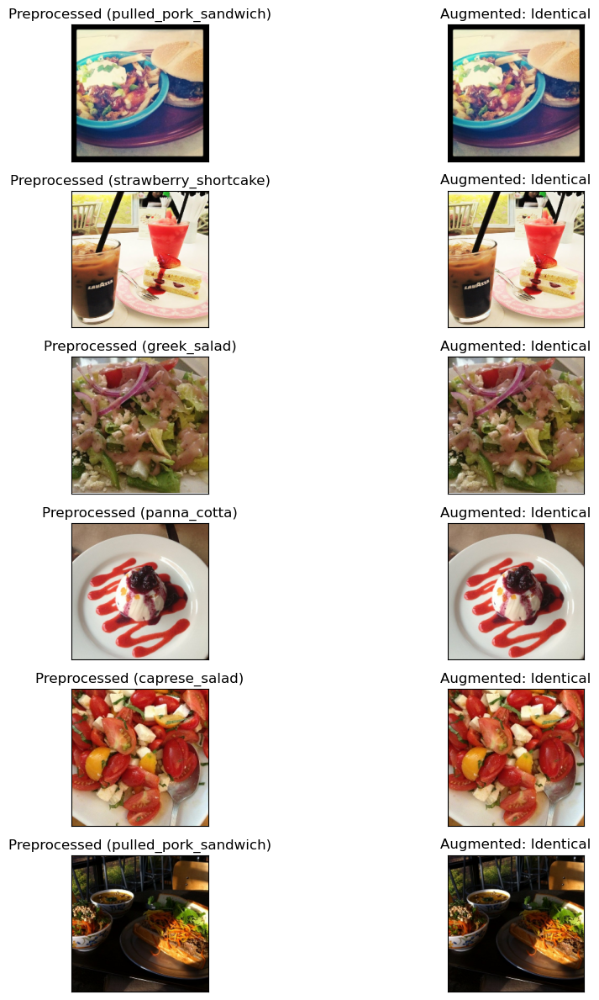

In [19]:
# Augmented images VS the processed ones. The sampling is random. As a result, sometimes the images are identical, and sometimes different.
num_examples = 6
fig, ax = plt.subplots(num_examples, 2, figsize=(12, num_examples * 2))
for i, (image, label) in enumerate(train_data_preprocessed.unbatch().take(num_examples)):
#    augm_img = data_augmentation_layers(image)
    augm_img = augment(image, threshold=0.5)
    ax[i][0].imshow(image/255)
    ax[i][1].imshow(augm_img/255)
    ax[i][0].set_title('Preprocessed ({})'.format(class_names[label], fontsize=10))
    ax[i][1].set_title('Augmented: {}'.format('Identical' if (image==augm_img).numpy().all() else 'Non-identical', fontsize=10))
plt.setp(ax, xticks=[], yticks=[])
plt.tight_layout()
#del(num_examples, i, image, label, augm_img, fig, ax)

In [20]:
# How many images remain the same after thz augmentation? The result is fixed by the 'threshold' parameter. 
print('The (approx.) percentage of images left unmodified by the random augmentation: {}%'.format(round(100 * 
                                    np.mean([(augment(image, threshold=0.5)==image).numpy().all() for (image, _) in train_data_preprocessed.unbatch().take(500)]), 5)))

The (approx.) percentage of images left unmodified by the random augmentation: 51.4%


In [21]:
# Map to augment the proceessed train data 
train_data_augmented = train_data_preprocessed.map(map_func=(lambda image, label: (augment(image, threshold=0.5), label)), num_parallel_calls=tf.data.AUTOTUNE)

## Precision Policy

In [22]:
# Changing the precision policy accelerates the performance
tf.keras.mixed_precision.set_global_policy(policy="mixed_float16") # set global policy to mixed precision

In [23]:
print(mixed_precision.global_policy())

<DTypePolicy "mixed_float16">


## Building the model

In [24]:
# Define inputs
input_shape = test_data_preprocessed.element_spec[0].shape.as_list()[1:]
inputs = layers.Input(shape=input_shape, dtype=tf.float32, name="input_layer")

# Create the initial model based on EfficientNetB0
base_model = tf.keras.applications.EfficientNetB0(include_top=False, input_tensor=inputs)
base_model.trainable = False      

x = layers.GlobalAveragePooling2D(name="pooling_layer")(base_model.output)
x = layers.Dropout(rate=0.2, name="dropout")(x)
x = layers.Dense(len(class_names), name="classes")(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name="prediction_layer")(x)

model = tf.keras.Model(inputs, outputs, name="EfficientNet")

In [25]:
display(model.summary(show_trainable=True))

Model: "EfficientNet"

┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)      ┃ Output Shape    ┃   Param # ┃ Connected to   ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer       │ (None, 224,     │         0 │ -              │   -   │
│ (InputLayer)      │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ rescaling         │ (None, 224,     │         0 │ input_layer[0… │   -   │
│ (Rescaling)       │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ normalization     │ (None, 224,     │         7 │ rescaling[0][… │   N   │
│ (Normalization)   │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ rescaling_1       │ (None, 224,     │         0 │ normalization… │   -   │
│ (Rescaling)       │ 224, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_conv_pad     │ (None, 225,     │         0 │ rescaling_1[0… │   -   │
│ (ZeroPadding2D)   │ 225, 3)         │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_conv         │ (None, 112,     │       864 │ stem_conv_pad… │   N   │
│ (Conv2D)          │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_bn           │ (None, 112,     │       128 │ stem_conv[0][… │   N   │
│ (BatchNormalizat… │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ stem_activation   │ (None, 112,     │         0 │ stem_bn[0][0]  │   -   │
│ (Activation)      │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_dwconv    │ (None, 112,     │       288 │ stem_activati… │   N   │
│ (DepthwiseConv2D) │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_bn        │ (None, 112,     │       128 │ block1a_dwcon… │   N   │
│ (BatchNormalizat… │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_activati… │ (None, 112,     │         0 │ block1a_bn[0]… │   -   │
│ (Activation)      │ 112, 32)        │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_squee… │ (None, 32)      │         0 │ block1a_activ… │   -   │
│ (GlobalAveragePo… │                 │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_resha… │ (None, 1, 1,    │         0 │ block1a_se_sq… │   -   │
│ (Reshape)         │ 32)             │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_reduce │ (None, 1, 1, 8) │       264 │ block1a_se_re… │   N   │
│ (Conv2D)          │                 │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_expand │ (None, 1, 1,    │       288 │ block1a_se_re… │   N   │
│ (Conv2D)          │ 32)             │           │                │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_se_excite │ (None, 112,     │         0 │ block1a_activ… │   -   │
│ (Multiply)        │ 112, 32)        │           │ block1a_se_ex… │       │
├───────────────────┼─────────────────┼───────────┼────────────────┼───────┤
│ block1a_project_… │ (None, 112,     │       512 │ block1a_se_ex… │   N 

 Total params: 4,178,952 (15.94 MB)

 Trainable params: 129,381 (505.39 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

None

In [26]:
 # Use the sparse categorical cross-entropy, as labels are NOT one-hot
model.compile(loss="sparse_categorical_crossentropy",                           
              optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              metrics=["accuracy", "sparse_categorical_crossentropy"])

In [27]:
columns=['Trainable','Type','Policy type']
display(pd.DataFrame([(layer.trainable, layer.dtype, layer.dtype_policy.name) for layer in model.layers], 
             columns=columns).groupby(columns).size().to_frame('Total').reset_index())
del(columns)

,Trainable,Type,Policy type,Total
0,False,float32,mixed_float16,238
1,True,float32,float32,1
2,True,float32,mixed_float16,3


In [ ]:
# One can shorten the running time by reducing the initial number of epochs
# If no checkpoint folder added to the iniial run, it will generated by the code
# So, provided the save model accuracy is higher, the large number of epochs will be unnecessary (see below)
epochs = 12

filepath='./checkpoints/checkpoint.model.keras'
if os.path.exists(filepath):  # Checking whether the checkpoint folder has already been created
    model = tf.keras.models.load_model(filepath=filepath)
    print('Calculating the (approx.) saved model accuracy:')
    final_val_categorical_accuracy = model.evaluate(test_data_preprocessed.take(test_data_preprocessed.cardinality().numpy() // 10))[1]
    print('The saved model has {} % testset accuracy'.format(round(100 * final_val_categorical_accuracy,1),2))
    # Adjusting the number of epochs according to the previously saved results in the checkpoint folder
    if final_val_categorical_accuracy > 0.7:
        # Only two epochs if the accuracy is higher than 70% 
        epochs = 2
    elif final_val_categorical_accuracy > 0.5:
        # Only four epochs if the accuracy is higher than 50%, but lower than 70% 
        epochs = 4        
    del(final_val_categorical_accuracy)
else:
    print('No model has been saved yet.')
    
print('Running the model for {} epochs.'.format(epochs))

# Checkpoints
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=filepath, monitor="sparse_categorical_crossentropy", save_freq="epoch", save_best_only = True)

# Early stopping
model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',       # The test set will determine the stopping policy 
                                                        patience=1,               # Wait for one more epoch before stopping
                                                        restore_best_weights=True)

history = model.fit(train_data_augmented, 
                    epochs=epochs,
                    steps_per_epoch=len(train_data_augmented)//batch_size, 
                    validation_data=test_data_preprocessed,
                    validation_steps=batch_size,
                    callbacks = [model_checkpoint_callback, model_early_stopping],
                    verbose=1
                   )


Calculating the (approx.) saved model accuracy:
15/15 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - accuracy: 0.5336 - loss: 2.1968 - sparse_categorical_crossentropy: 2.1968
The saved model has 54.6 % testset accuracy
Running the model for 4 epochs.
Epoch 1/4
59/59 ━━━━━━━━━━━━━━━━━━━━ 241s 4s/step - accuracy: 0.5062 - loss: 2.3535 - sparse_categorical_crossentropy: 2.3535 - val_accuracy: 0.5225 - val_loss: 2.2278 - val_sparse_categorical_crossentropy: 2.2278
Epoch 2/4
59/59 ━━━━━━━━━━━━━━━━━━━━ 225s 4s/step - accuracy: 0.5218 - loss: 2.2933 - sparse_categorical_crossentropy: 2.2933 - val_accuracy: 0.5420 - val_loss: 2.1785 - val_sparse_categorical_crossentropy: 2.1785
Epoch 3/4
59/59 ━━━━━━━━━━━━━━━━━━━━ 267s 5s/step - accuracy: 0.5279 - loss: 2.2862 - sparse_categorical_crossentropy: 2.2862 - val_accuracy: 0.5771 - val_loss: 2.1174 - val_sparse_categorical_crossentropy: 2.1174
Epoch 4/4
59/59 ━━━━━━━━━━━━━━━━━━━━ 229s 4s/step - accuracy: 0.4793 - loss: 2.3533 - sparse_categorical_crossentropy: 

In [46]:
model = tf.keras.models.load_model(filepath=filepath)
final_val_categorical_accuracy = model.evaluate(test_data_preprocessed.take(test_data_preprocessed.cardinality().numpy() // 10))[1]
print('The saved model has {} % testset accuracy'.format(round(100 * final_val_categorical_accuracy),2))

15/15 ━━━━━━━━━━━━━━━━━━━━ 42s 2s/step - accuracy: 0.5564 - loss: 2.0631 - sparse_categorical_crossentropy: 2.0631
The saved model has 52 % testset accuracy


## Results

In [47]:
# Outputs by epoch
# Three columns for the in-sample results, and three for the out-of-sample predictions.
display(pd.DataFrame.from_dict(dict(history.history.items())).reset_index().rename(columns={'index':'epoch'}))

,epoch,accuracy,loss,sparse_categorical_crossentropy,val_accuracy,val_loss,val_sparse_categorical_crossentropy
0,0,0.516419,2.330330,2.330330,0.522461,2.227752,2.227752
1,1,0.516949,2.290354,2.290354,0.541992,2.178546,2.178546
2,2,0.537076,2.244436,2.244436,0.577148,2.117439,2.117439
3,3,0.492585,2.316269,2.316269,0.547852,2.150244,2.150244


In [48]:
final_val_loss, final_val_categorical_accuracy, val_sparse_categorical_crossentropy = model.evaluate(test_data_preprocessed)

158/158 ━━━━━━━━━━━━━━━━━━━━ 380s 2s/step - accuracy: 0.5438 - loss: 2.1692 - sparse_categorical_crossentropy: 2.1692


In [49]:
print('Out-of-sample accuracy: {} %'.format(round(100*final_val_categorical_accuracy, 1)))

Out-of-sample accuracy: 55.1 %


In [50]:
# The unshuffling is needed to keep the right labels attached to the images
test_data_preprocessed_UNSHUFFLED = tf.data.Dataset.from_tensor_slices(tuple([np.array(tup) for tup in zip(*test_data_preprocessed.unbatch())]))
test_data_preprocessed_UNSHUFFLED = test_data_preprocessed_UNSHUFFLED.batch(batch_size)

In [ ]:
# Calculating the test set predictions
predictions = model.predict(test_data_preprocessed_UNSHUFFLED)

158/158 ━━━━━━━━━━━━━━━━━━━━ 405s 3s/step


In [52]:
print('Re-calculating the test dataset accuracy: {} %'.format(round(100*
                        np.mean([label == prediction.argmax() for (_,label), prediction in zip(test_data_preprocessed_UNSHUFFLED.unbatch().as_numpy_iterator(), predictions)]), 1)))

Re-calculating the test dataset accuracy: 55.1 %


70 misclassified images shown:
--------------------------------------------------------------------------------------------------------------------------------------------------  



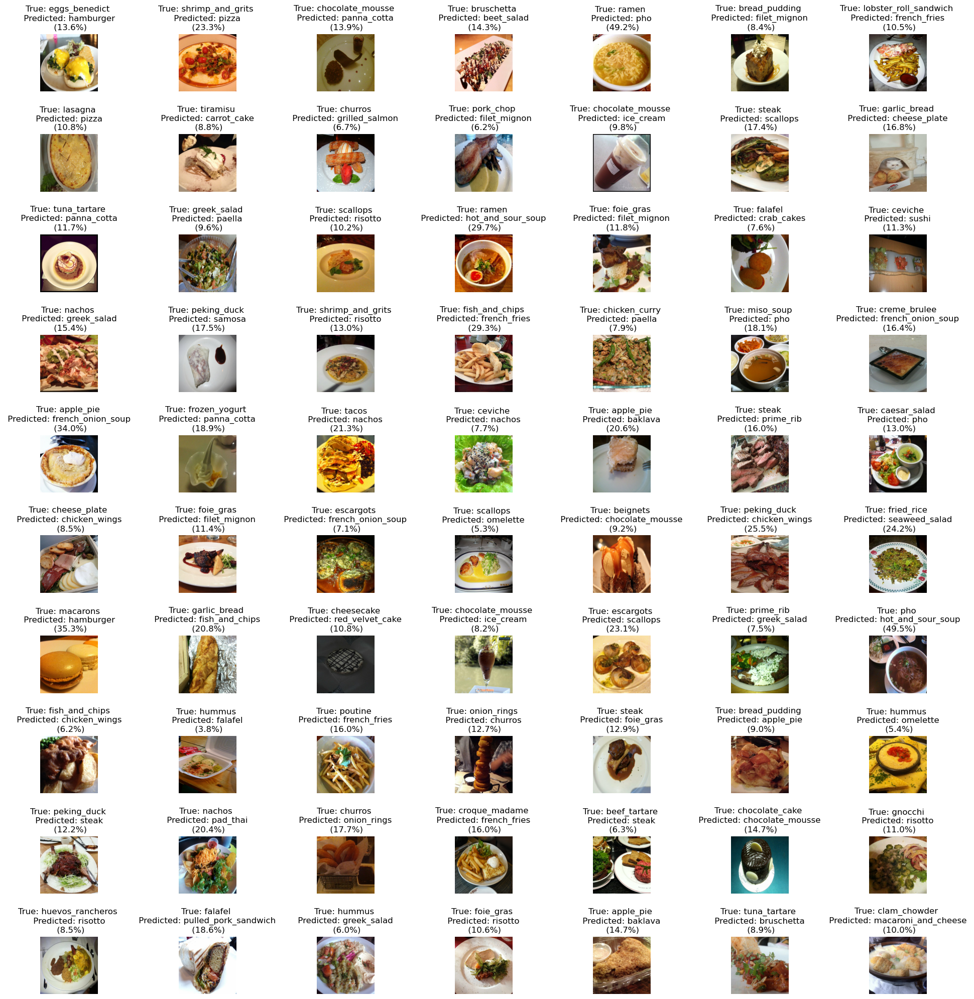

In [53]:
n_cols = 7
n_rows = min(10, int(np.ceil((1 - final_val_categorical_accuracy) * (test_data_preprocessed_UNSHUFFLED.cardinality().numpy() * batch_size) / n_cols)))

fig, ax = plt.subplots(n_rows, n_cols, figsize=(20, int(2. * n_rows)))
i = 0
for (image,label), prediction in zip(test_data_preprocessed_UNSHUFFLED.unbatch().as_numpy_iterator(), predictions):
    if label != prediction.argmax():
        ax[i // n_cols][i % n_cols].imshow(image / 255)
        ax[i // n_cols][i % n_cols].set_title('True: {} \n Predicted: {} \n ({}%)'
                                              .format(class_names[label], class_names[prediction.argmax()], 
                                                      round(prediction[prediction.argmax()] * 100, 1)), fontsize=12)
        i += 1
        if i >= n_cols * n_rows:
            break

print('{} misclassified images shown:'.format(i))
print('--------------------------------------------------------------------------------------------------------------------------------------------------  \n')

for ax in ax.ravel():
    ax.set_axis_off()
plt.tight_layout(h_pad=2., w_pad=1.)

del(n_rows, n_cols, fig, ax, image, label, prediction, i) 

In [ ]:
# The confusion matrix for a few random columns
columns = np.random.choice(class_names, 8)

X=(pd.DataFrame([(class_names[label], class_names[prediction.argmax()]) for (image,label), prediction in zip(test_data_preprocessed_UNSHUFFLED.unbatch().as_numpy_iterator(), predictions)], 
                     columns=['True', 'Predicted']
                    ).groupby(['True', 'Predicted']).size().unstack('Predicted',fill_value=0))
display(X.loc[columns,columns])
del(columns, X)

Predicted,chicken_quesadilla,chicken_wings,edamame,chocolate_cake,cheese_plate,scallops,macarons,steak
True,,,,,,,,
chicken_quesadilla,29,0,0,0,0,0,0,0
chicken_wings,0,46,0,0,0,0,0,0
edamame,0,0,46,0,0,0,0,0
chocolate_cake,0,0,0,27,1,0,2,0
cheese_plate,0,1,0,1,31,1,0,0
scallops,0,0,0,0,1,17,0,0
macarons,0,0,0,0,0,0,35,0
steak,0,0,0,0,0,1,0,6
